# Load model

In [30]:
!nvidia-smi

Sat Mar 18 10:54:55 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 516.40       Driver Version: 516.40       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   51C    P5     5W /  N/A |   2800MiB /  4096MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Importing Necessary libraries

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from IPython.display import Image
from sklearn.model_selection import train_test_split
from matplotlib.pyplot import imread
import tensorflow_hub as hub
import os

In [32]:
labels = pd.read_csv("data/train.csv")
labels

,image_id,label,variety,age
0,100330.jpg,bacterial_leaf_blight,ADT45,45
1,100365.jpg,bacterial_leaf_blight,ADT45,45
2,100382.jpg,bacterial_leaf_blight,ADT45,45
3,100632.jpg,bacterial_leaf_blight,ADT45,45
4,101918.jpg,bacterial_leaf_blight,ADT45,45
...,...,...,...,...
10402,107607.jpg,tungro,Zonal,55
10403,107811.jpg,tungro,Zonal,55
10404,108547.jpg,tungro,Zonal,55
10405,110245.jpg,tungro,Zonal,55


In [33]:
# create pathname from labels id
filenames = ["data/train_images/"+ dirname + "/" for dirname in labels["label"]]
filenames = [ filenames[i] + labels['image_id'][i] for i in range(len(labels['image_id']))]  

filenames[:10]

['data/train_images/bacterial_leaf_blight/100330.jpg',
 'data/train_images/bacterial_leaf_blight/100365.jpg',
 'data/train_images/bacterial_leaf_blight/100382.jpg',
 'data/train_images/bacterial_leaf_blight/100632.jpg',
 'data/train_images/bacterial_leaf_blight/101918.jpg',
 'data/train_images/bacterial_leaf_blight/102353.jpg',
 'data/train_images/bacterial_leaf_blight/102848.jpg',
 'data/train_images/bacterial_leaf_blight/103051.jpg',
 'data/train_images/bacterial_leaf_blight/103702.jpg',
 'data/train_images/bacterial_leaf_blight/103920.jpg']

In [34]:
train_dir = [ filenames[i] + labels['image_id'][i] for i in range(len(labels['image_id']))]

In [35]:
labels_b = labels["label"]
labels_b = np.array(labels_b)
labels_b , labels_b.shape

(array(['bacterial_leaf_blight', 'bacterial_leaf_blight',
        'bacterial_leaf_blight', ..., 'tungro', 'tungro', 'tungro'],
       dtype=object),
 (10407,))

In [36]:
if len(filenames) == len(labels_b):
    print("They are matched : )")
else:
    print("They are not matched :(")

They are matched : )


In [37]:
# find the unique labels
unique_disease = np.unique(labels_b)
unique_disease

array(['bacterial_leaf_blight', 'bacterial_leaf_streak',
       'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart',
       'downy_mildew', 'hispa', 'normal', 'tungro'], dtype=object)

In [38]:
boolean_labels = [label == unique_disease for label in labels_b] # list comprehension
len(boolean_labels)  # for every unique disease we have got arrays of boolean values

10407

In [39]:
# create x and y labels
x = filenames
y = boolean_labels

# splitting the train and test data set by 80:20 ratio

In [40]:

x_train , x_valid , y_train , y_valid = train_test_split(x,y,test_size=0.2)

len(x_train) , len(x_valid) , len(y_train) , len(y_valid)

(8325, 2082, 8325, 2082)

In [41]:
# define image size
IMG_SIZE = 224

## Converting an image into numpy array and resizing all images in a fixed size

In [42]:
def preprocess_image(img_path, img_size=IMG_SIZE):
    """
    Take an image file as an input and convert into the Tensors.
    """
    
    # Read in an image file
    image = tf.io.read_file(img_path)
    
    # Turn the jpeg image into numerical Tensor with 3 color channel (RGB)
    image = tf.image.decode_jpeg(image, channels=3)
    
    # convert the color channels from 0-255 to 0-1
    image = tf.image.convert_image_dtype(image, tf.float32)
    
    # Resize the image to the desired values
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
    
    return image

In [43]:
# Create a simple function

def get_image_label(img_path, labels):
    """
    Takes an image path as an input and return as of them tuple of image and label
    """
    
    image = preprocess_image(img_path)
    
    return image, labels

In [44]:
# Define the batch size
BATCH_SIZE = 32


## Create a function to convert the data into the batches

In [45]:
def create_batches(x, y=None, batch_size=BATCH_SIZE,val_data=False, test_data=False):
    """
    Create batches of data of our images (X) and (Y)
    Shuffle the data if it's training data but doesn't shuffle it it's validation data
    Also accepts test data as an input( no labels)
    """
    
    if test_data:
        print("Creating the test Data Batches......")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))  # only filepaths no labels
        data_batch = data.map(preprocess_image).batch(BATCH_SIZE)
    elif val_data:
        print("Creating the valid Data Batches.....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    else:
        print("Creating the Training Data Batches....")

        # Turn filepaths and labels into the Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))

        # Shuffling pathnames and labels before mapping image preprocessor funcion is faster than shuffling images
        data = data.shuffle(buffer_size=len(x))

        # Creata a image, label this will also convert the data preprocessed image
        data = data.map(get_image_label)

        # Turning into the data batches
        data_batch = data.batch(BATCH_SIZE)
    
    return data_batch

## Splitting the batches into train and validation dataset

In [46]:
# Create the training and validation data batches
train_data = create_batches(x_train, y_train)
valid_data = create_batches(x_valid, y_valid, val_data=True)

Creating the Training Data Batches....
Creating the valid Data Batches.....


In [47]:
train_data.element_spec , valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)))

##Create a function for viewing the images for the data batches

In [48]:
def show_25_images(image, labels):
    """
    Display a plot of 25 images and their labels from a data batch
    """
    # Setup the figure
    plt.figure(figsize=(10,10))
    # Loop through 25 (for displaying 25 images)
    for i in range(25):
        # Create a subplots ( 5 rows and 5 columns )
        ax = plt.subplot(5 , 5 , i+1)
        # Display an image
        plt.axis("off")
        plt.imshow(image[i])
        # Add the image label as the title
        plt.title(unique_disease[labels[i].argmax()])
        

In [49]:
unique_disease[y[0].argmax()]

'bacterial_leaf_blight'

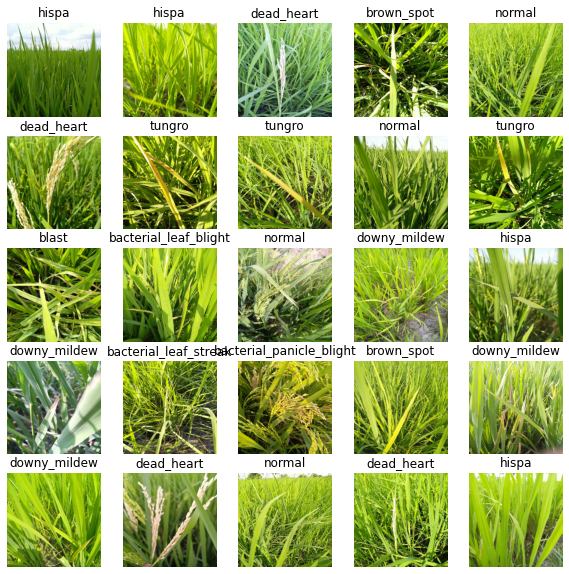

In [50]:
train_images, train_labels = next(train_data.as_numpy_iterator())
# Now let's visualize the data by using the function
show_25_images(train_images, train_labels)

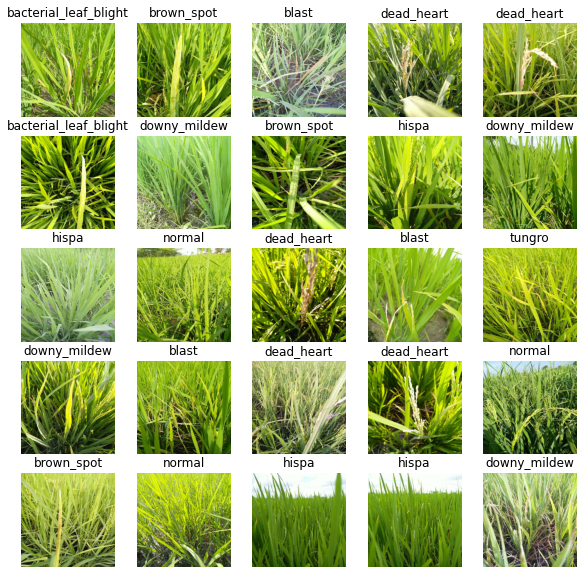

In [51]:
# now let's visualize the validation data
val_images , val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [52]:
IMG_SIZE

224

In [53]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [54]:
loaded_full_model = load_model('Model/')

Loading saved model from: Model/


In [55]:
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  Args:
    history: TensorFlow model History object (see: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/History)
  """ 
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

In [56]:
loaded_full_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [57]:
loaded_model_accuracy = loaded_full_model.evaluate(valid_data)
loaded_model_accuracy

66/66 [==============================] - 20s 298ms/step - loss: 0.0602 - accuracy: 0.9817


[0.06021520122885704, 0.9817483425140381]

# Making and evaluating predictions using a trained model


In [58]:
# make prediction on valid data
predictions_valid_data = loaded_full_model.predict(valid_data, verbose=1)
predictions_valid_data

66/66 [==============================] - 20s 301ms/step


array([[9.9731344e-01, 8.1641240e-08, 3.6523543e-06, ..., 1.9944490e-04,
        1.5842689e-04, 1.5848840e-04],
       [1.1240071e-05, 6.6060892e-08, 2.5236744e-07, ..., 1.9501790e-04,
        6.5120287e-07, 5.1297632e-04],
       [1.2519300e-03, 4.6511730e-08, 2.7302393e-08, ..., 3.5915850e-06,
        2.0176422e-08, 7.0862770e-03],
       ...,
       [2.2066198e-08, 3.8712390e-08, 8.2272660e-09, ..., 2.1102262e-05,
        9.9984753e-01, 4.3593889e-08],
       [5.8935662e-10, 1.8081880e-07, 6.4993215e-12, ..., 2.0285565e-08,
        1.2267303e-09, 3.7515466e-11],
       [3.5437781e-16, 1.5552897e-15, 2.7600312e-18, ..., 5.0378195e-16,
        3.9821131e-16, 8.6254381e-09]], dtype=float32)

In [59]:
np.sum(predictions_valid_data[0]) , np.sum(predictions_valid_data[1]) , np.sum(predictions_valid_data[2]) , np.sum(predictions_valid_data[3])

(0.99999994, 1.0, 1.0, 1.0)

In [60]:
# First Predictions
index = 200

print(predictions_valid_data[index])
print(f"MAx value in the predictions is {np.max(predictions_valid_data[index])}")
print(f"Sum of the values is {np.sum(predictions_valid_data[index])}")
print(f"Max value index is {np.argmax(predictions_valid_data[index])}")
print(f"Max value label is {unique_disease[np.argmax(predictions_valid_data[index])]}")

[4.2503843e-12 1.4999729e-07 2.4050742e-18 3.4298051e-08 5.4202925e-10
 8.8835644e-17 4.8579470e-11 6.3824568e-16 6.2291311e-11 9.9999976e-01]
MAx value in the predictions is 0.9999997615814209
Sum of the values is 0.9999999403953552
Max value index is 9
Max value label is tungro


In [61]:
# Turning the predcitions probablities into there respective labels

def get_pred_label(predictions_probabilities):
    """
    Truns the predicition probabilities into there respective labels
    """
    
    return unique_disease[np.argmax(predictions_probabilities)]



In [62]:
# create a function to unbatch the data
def unbatchify(batch_data):
    """
    Takes an input of the batch data and return into the unbatched data.
    Note it will return as (images, labels)
    """
    # let's now unbatch the data
    images_ = []
    labels_ = []

    for image, label in batch_data.unbatch().as_numpy_iterator():
        # append into the list
        images_.append(image)
        labels_.append(unique_disease[np.argmax(label)])
    
    return images_, labels_

# now let's unbatchify the batch data
val_images , val_labels = unbatchify(valid_data)

val_labels[0]

'bacterial_leaf_blight'

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [63]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
    
    
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

In [64]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-11:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_disease[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    #top-plot basically have each bar indexes so argmax return indices of that bar which is true.
  else:
    pass

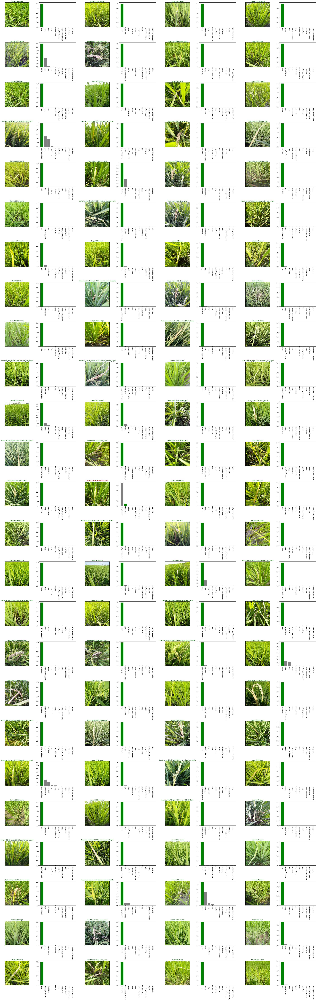

In [65]:
# Let's check out a few predictions and their different values
i_multiplier = 30
num_rows = 25
num_cols = 4
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions_valid_data,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions_valid_data,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.savefig('loadedmodel.png', facecolor='w')
plt.show()

# custom images

In [66]:
# Get custom image filepaths
custom_path = "custo_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
# Turn custom images into batch datasets 
custom_data = create_batches(custom_image_paths, test_data=True)
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

Creating the test Data Batches......
1/1 [==============================] - 2s 2s/step


In [67]:
custom_image_paths

['custo_images/bacterial_leaf_blight.jpg',
 'custo_images/bacterial_leaf_streak.jpg',
 'custo_images/bacterial_panicle_blight.jpg',
 'custo_images/blast-neck.jpg',
 'custo_images/brown_spot.jpg',
 'custo_images/dead_heart (2).jpg',
 'custo_images/dead_heart.JPG',
 'custo_images/downey_mildew.jpg',
 'custo_images/hispa.jpeg',
 'custo_images/tungro.jpg']

In [68]:
custom_pred_labels

['bacterial_leaf_blight',
 'bacterial_leaf_streak',
 'bacterial_panicle_blight',
 'blast',
 'blast',
 'dead_heart',
 'dead_heart',
 'downy_mildew',
 'hispa',
 'tungro']

In [69]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

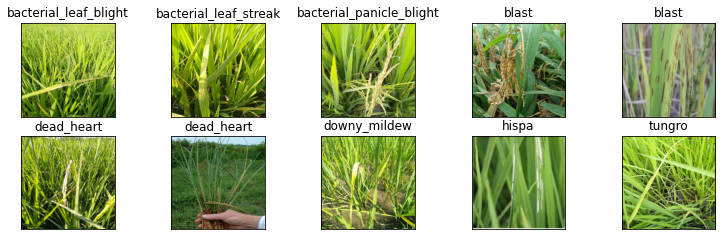

In [70]:
# Check custom image predictions
plt.figure(figsize=(13, 10))
for i, image in enumerate(custom_images):
  ax = plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [71]:
len(unique_disease)

10

In [72]:
import json

In [73]:
s = json.load(open("pesticides.json"))

In [74]:
print(s)

{'bacterial_leaf_blight': ['Copper oxychloride 50 WP (copper oxychloride)', 'Nativo 75 WDG (Tebuconazole+trifloxystrobin)', 'Gem Star Super 325 SC (azoxystrobin+difenconazole) and Bordeaux mixture'], 'bacterial_leaf_streak': ['streptomycin sulphate and tetracycline combination 300g +copper oxychloride 1.25 kg/ha'], 'bacterial_panicle_blight': ['Carbendazim 50WP @ 500g/ha', 'Tricyclozole 75 WP @ 500g/ha', 'Metominostrobin 20 SC @ 500ml/ha'], 'blast': ['chlorothalonil', 'tricyclazole', 'hexaconazole'], 'brown_spot': ['captan', 'thiram', 'chitosan'], 'dead_heart': ['Flubendiamide 240 SC + Thiacloprid 240 SC (combination product) @ 200 ml/ha', 'Flubendiamide 240 SC + Thiacloprid 240 SC (combination product) @ 250 ml/ha', 'Imidacloprid 17.8 SL @150 ml/ha'], 'downy_mildew': ['Alion 500 SC Herbicide', 'Buctril 200 EC Herbicide', 'Infinity Ultra Herbicide'], 'hispa': ['Methyl parathion 0.05% or Quinalphos 0.05%'], 'normal': ['Copper oxychloride 50% WP @ 2.5 gm/liter', 'Propiconazole 25% EC @ 1

In [75]:
from PIL import Image
import cv2

In [76]:
def preprocess_image(image):
    # Resize the image to the size expected by the model
    image = image.resize((224, 224))
    # Convert the image to a numpy array
    image_array = np.asarray(image)
    # Normalize the pixel values to be between 0 and 1
    image_array = image_array / 255.0
    # Add an extra dimension to the array to represent the batch size of 1
    image_array = np.expand_dims(image_array, axis=0)
    return image_array
image = Image.open("custo_images/bacterial_leaf_streak.jpg")
# Preprocess the image
print(image)
image_array = preprocess_image(image)
# Use the model to make a prediction
prediction = loaded_full_model.predict(image_array)

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=480x640 at 0x249C93FD640>
1/1 [==============================] - 1s 737ms/step


In [77]:
prediction

array([[7.7814775e-06, 4.7901240e-01, 2.4388157e-06, 3.7931226e-02,
        4.1134097e-02, 3.0381873e-06, 4.0245053e-01, 5.6768069e-03,
        2.8048242e-05, 3.3753548e-02]], dtype=float32)

In [78]:
np.argmax(prediction)

1

In [79]:
unique_disease

array(['bacterial_leaf_blight', 'bacterial_leaf_streak',
       'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart',
       'downy_mildew', 'hispa', 'normal', 'tungro'], dtype=object)

In [80]:
len(s[unique_disease[0]])

3

In [81]:
custom_image = "custo_images/bacterial_leaf_blight.jpg"

In [98]:
pesticide_img = {
    "bacterial_leaf_blight" : "pesticides/bacterial_leaf_blight.png",
    "bacterial_leaf_streak" : "pesticides/bacterial_leaf_streak.jpeg.jpg",
    "bacterial_panicle_blight" : "pesticides/bacterial_panicle_blight.png",
    "blast" : "pesticides/blast.png",
    "brown_spot" : "pesticides/brown_spot.png",
    "dead_heart" : "pesticides/dead_heart.png",
    "downy_mildew" : "pesticides/downy_mildew.png",
    "hispa" : "pesticides/hispa.jpeg",
    "normal" : "pesticides/normal.jpg",
    "tungro" : "pesticides/tungro.jpg"
}

In [95]:
from PIL import Image
def preprocess_image(img):
    # Resize the image to the size expected by the model
    image = img.resize((224, 224))
    # Convert the image to a numpy array
    image_array = np.asarray(image)
    # Normalize the pixel values to be between 0 and 1
    image_array = image_array / 255.0
    # Add an extra dimension to the array to represent the batch size of 1
    image_array = np.expand_dims(image_array, axis=0)
    return image_array
def pesticides_unique(img):
#     print(img)
    
    img_modi = cv2.imwrite("framex.jpg", img)
    print(img_modi)
    image = Image.open("framex.jpg")
    # Preprocess the image
    image_array = preprocess_image(image)
    # Use the model to make a prediction
    prediction = loaded_full_model.predict(image_array)
    print("The predicted disease is ", unique_disease[np.argmax(prediction)])
#     print(f"The pesticides required is ")
    if len(s[unique_disease[np.argmax(prediction)]]) > 1:
        for i in s[unique_disease[np.argmax(prediction)]]:
            pest = ",\n ".join(s[unique_disease[np.argmax(prediction)]])
    else:
        
#         print(s[unique_disease[np.argmax(prediction)]][0])
        pest = s[unique_disease[np.argmax(prediction)]][0]
    
    return unique_disease[np.argmax(prediction)], pest , pesticide_img[unique_disease[np.argmax(prediction)]]

In [96]:

pesticides_unique(cv2.imread(custom_image))

True
1/1 [==============================] - 0s 20ms/step
The predicted disease is  bacterial_leaf_blight


('bacterial_leaf_blight',
 'Copper oxychloride 50 WP (copper oxychloride),\n Nativo 75 WDG (Tebuconazole+trifloxystrobin),\n Gem Star Super 325 SC (azoxystrobin+difenconazole) and Bordeaux mixture',
 'pesticides/bacterial_leaf_blight.png')

In [84]:
model_json = loaded_full_model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)

In [85]:
import gradio as gr

In [97]:
gr.Interface(fn=pesticides_unique, inputs=gr.Image(shape=(224,224)),outputs=["text","text","image"],title="Paddy Doctor",
                   examples=["custo_images/bacterial_leaf_blight.jpg",
                             "custo_images/bacterial_leaf_streak.jpg",
                            "custo_images/bacterial_panicle_blight.jpg", 
                             "custo_images/dead_heart.JPG",
                             "custo_images/downey_mildew.jpg",
                             "custo_images/tungro.jpg"],flagging_options=None).launch()

Running on local URL:  http://127.0.0.1:7864

To create a public link, set `share=True` in `launch()`.


True
1/1 [==============================] - 0s 22ms/step
The predicted disease is  bacterial_leaf_blight
True
1/1 [==============================] - 0s 23ms/step
The predicted disease is  blast
True
1/1 [==============================] - 0s 24ms/step
The predicted disease is  hispa
